In [1]:
%pip install tensorflow tqdm pillow matplotlib

Note: you may need to restart the kernel to use updated packages.


# Set up the model

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import PIL
from typing import List, Dict, Union, Tuple, Optional
import PIL.Image
import multiprocessing
from functools import partial

pool = multiprocessing.Pool(processes=10)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


2023-05-28 13:39:10.531094: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-05-28 13:39:10.568690: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-05-28 13:39:10.569457: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-28 13:39:11.204098: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/anthony/workspace/thumbnail-gan/.venv/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Num GPUs Available:  0


2023-05-28 13:39:12.178365: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:982] could not open file to read NUMA node: /sys/bus/pci/devices/0000:0a:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-05-28 13:39:12.198104: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [3]:

# Define the generator network
def build_generator(latent_dim):
    model = keras.Sequential([
        layers.Dense(256, input_dim=latent_dim, activation='relu'),
        layers.Dense(512, activation='relu'),
        layers.Dense(1024, activation='relu'),
        layers.Dense(3*64*64, activation='tanh'),
        layers.Reshape((64, 64, 3))
    ])
    return model

# Define the discriminator network
def build_discriminator():
    model = keras.Sequential([
        layers.Flatten(input_shape=(64, 64, 3)),
        layers.Dense(512, activation='relu'),
        layers.Dense(256, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

# Combine the generator and discriminator into a GAN
def build_gan(generator, discriminator):
    discriminator.trainable = False
    model = keras.Sequential([
        generator,
        discriminator
    ])
    return model


def visualize_thumbnails(image_list):
    num_images = image_list.shape[0]

    # Create a grid of subplots to display the images
    fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(12, 10))

    # Iterate over the subplots and plot the generated images
    for i, ax in enumerate(axs.flat):
        # Rescale the pixel values from -1 to 1 to the range 0 to 255
        image = ((image_list[i] + 1) * 127.5).astype(int)
        ax.imshow(image)
        ax.axis('off')

    # Adjust the spacing between subplots
    plt.subplots_adjust(wspace=0.05, hspace=0.05)

    # Show the plot
    plt.show()


In [4]:

# Define the loss functions
def discriminator_loss(real_output, fake_output):
    # Adversarial loss or binary cross-entropy loss
    real_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(real_output), real_output))
    fake_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.zeros_like(fake_output), fake_output))
    disc_loss = real_loss + fake_loss
    return disc_loss

def generator_loss(fake_output):
    # Adversarial loss or binary cross-entropy loss
    gen_loss = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(fake_output), fake_output))
    return gen_loss


In [5]:

# Define the optimizer
generator_optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

# Training loop
@tf.function
def train_step(images,  gan, generator, discriminator):
    noise = tf.random.normal([BATCH_SIZE, latent_dim]) # Defined globally before training

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))


    
    return disc_loss  # Return the discriminator loss as batch_loss

def load_weights(gan):
    try:
        gan.load_weights("/content/drive/MyDrive/thumbnail-project/weights")
        print("Loaded previous weights")
    except Exception as e:
        print(e)


def train(dataset, epochs, gan, generator, discriminator):
    # progress_bar_epochs = tqdm(range(epochs), desc='Epochs', position=0)
    
    for epoch in range(epochs):
        # progress_bar_epochs.update(1)
        
        progress_bar_batches = tqdm(dataset, position=0, leave=True)
        
        for image_batch in progress_bar_batches:
            loss = train_step(image_batch, gan, generator, discriminator)
            
            # progress_bar_batches.update(1)
            progress_bar_batches.set_postfix({'Epoch': epoch, 'Loss': loss})
        
        # progress_bar_batches.close()

        # Update the gan model weights by setting the generator and discriminator weights
        gan.set_weights(generator.get_weights() + discriminator.get_weights())
        gan.save_weights("/content/drive/MyDrive/thumbnail-project/weights")


    




# Download the dataset

In [6]:
import os
import tarfile

def is_colab():
    try:
        import google.colab
        return True
    except ModuleNotFoundError:
        return False


if is_colab():
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)

    # Specify the path to the directory containing the TGZ file
    directory_path = "/content/drive/MyDrive/thumbnail-project"

    # List the contents of the directory
    os.listdir(directory_path)



In [7]:
# This might already be done from before


if is_colab():
    # # # Specify the path to the TGZ file
    tgz_file_path = f"{directory_path}/thumbnails.tgz"
    extract_path = '/tmp/thumbnails' # Extract to local dir because I/O is horrible on google drive

    # # # Open the TGZ file
    with tarfile.open(tgz_file_path, 'r:gz') as tar:
        # Extract all files in the TGZ archive
        tar.extractall(path=extract_path)

    extract_data_dir = f'{extract_path}/data'
else:
    extract_data_dir = '/home/anthony/workspace/yt-data/data/'

print(f'Thumbnails in {extract_data_dir}')


Thumbnails in /home/anthony/workspace/yt-data/data/


In [8]:
# List the files in the extracted directory
# extract_path = f'{directory_path}/thumbnails'
file_list = os.listdir(extract_data_dir)
print(file_list[:10])
print(f'Found {len(file_list)} total files')
jpg_file_list = [file for file in file_list if file.endswith(".jpg")]
print(f'Found {len(jpg_file_list)} jpgs')

['pE9Qjif6K90.json', 'e1RSD8xLjJ8.json', 'oQkn5feunx0.jpg', 'SzZutCq2-Tc.json', 'qjWLM0DDD_g.json', 'RkZNyux07aQ.json', '_7HvkhauoF8.json', 'jGuYe53de0k.json', 'IPE-3x3GFWw.jpg', 'lqckcoDtG-o.json']
Found 39438 total files
Found 19719 jpgs


In [9]:

thumbnail_data: List[Tuple[str, str]] = [] # tuples of (path, id)

# Process or use the extracted files
for file_name in jpg_file_list:
    file_path = os.path.join(extract_data_dir, file_name)
    thumbnail_data.append((file_path, file_name.replace('.jpg', '')))

print(thumbnail_data[:10])
print(f'Found {len(thumbnail_data)} thumbnails')

[('/home/anthony/workspace/yt-data/data/oQkn5feunx0.jpg', 'oQkn5feunx0'), ('/home/anthony/workspace/yt-data/data/IPE-3x3GFWw.jpg', 'IPE-3x3GFWw'), ('/home/anthony/workspace/yt-data/data/kbcshufA-Io.jpg', 'kbcshufA-Io'), ('/home/anthony/workspace/yt-data/data/20aG024pmLc.jpg', '20aG024pmLc'), ('/home/anthony/workspace/yt-data/data/FPYKl2X5xAc.jpg', 'FPYKl2X5xAc'), ('/home/anthony/workspace/yt-data/data/fmhkZq0NdKY.jpg', 'fmhkZq0NdKY'), ('/home/anthony/workspace/yt-data/data/Ptg2bhLcoRY.jpg', 'Ptg2bhLcoRY'), ('/home/anthony/workspace/yt-data/data/gIJwAU5IRCs.jpg', 'gIJwAU5IRCs'), ('/home/anthony/workspace/yt-data/data/EHdewNSBArs.jpg', 'EHdewNSBArs'), ('/home/anthony/workspace/yt-data/data/_4wlsDNuuTw.jpg', '_4wlsDNuuTw')]
Found 19719 thumbnails


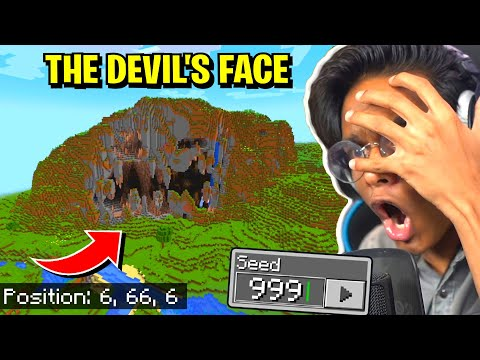

In [10]:
PIL.Image.open(thumbnail_data[0][0])

In [13]:
def load_and_preprocess_image(file_path):
    image = tf.io.read_file(file_path)
    image = tf.image.decode_jpeg(image, channels=3)  # Decode JPEG image
    image = tf.cast(image, tf.float32)
    image = (image / 255.0)  # Normalize to [0, 1]
    image = (image - 0.5) * 2  # Scale to [-1, 1]
    return image

def preprocess_images_parallel(image_paths, num_processes=2):
    print(f'preprocessing {len(image_paths)} images.')
    # preprocessed_images = list(tqdm(pool.imap(load_and_preprocess_image, image_paths), total=len(image_paths)))
    preprocessed_images = pool.map(load_and_preprocess_image, image_paths)

    return preprocessed_images



# dataset = preprocess_images_parallel([path for path, id in thumbnail_data[0:10]])
dataset = [load_and_preprocess_image(t[0]) for t in tqdm(thumbnail_data)] 
dataset

100%|██████████| 10/10 [00:00<00:00, 196.80it/s]

doing stuff with /home/anthony/workspace/yt-data/data/oQkn5feunx0.jpg
tf.Tensor(b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00\x84\x00\x05\x03\x04\x10\x10\x0f\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x10\x0f\x10\x10\x10\x0e\x10\x10\x10\x10\r\r\x10\x10\x10\r\x10\x10\x10\x10\x0f\x10\x10\x10\x10\x0f\r\x0e\x15\x10\x0f\x11\x11\x13\x13\x13\r\x0f\x16\x18\x16\x12\x18\x10\x12\x13\x12\x01\x05\x05\x05\x08\x07\x08\x0f\t\t\x0f\x16\x15\x12\x15\x17\x16\x17\x18\x18\x15\x15\x17\x17\x18\x16\x15\x17\x15\x15\x17\x15\x15\x17\x17\x15\x15\x16\x15\x15\x16\x16\x15\x15\x15\x15\x15\x15\x15\x15\x15\x17\x15\x15\x15\x15\x15\x15\x15\x15\x15\x15\x15\x15\x15\xff\xc0\x00\x11\x08\x01h\x01\xe0\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1d\x00\x00\x01\x04\x03\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x05\x06\x07\x02\x03\x08\x01\t\xff\xc4\x00_\x10\x00\x02\x01\x02\x04\x02\x07\x03\x06\t\x05\x0c\x07\x06\x05\x05\x01\x02\x11\x00\x03\x04\x12!1\x05A\x06\x07\x13"Qaq2\x81\

[<tf.Tensor: shape=(360, 480, 3), dtype=float32, numpy=
 array([[[-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.],
         ...,
         [-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.]],
 
        [[-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.],
         ...,
         [-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.]],
 
        [[-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.],
         ...,
         [-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.]],
 
        ...,
 
        [[-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.],
         ...,
         [-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.]],
 
        [[-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.],
         ...,
         [-1., -1., -1.],
         [-1., -1., -1.],
         [-1., -1., -1.]],
 
        [[-1., -1., -1.],
         [-1., -1., -1.],
         [-1

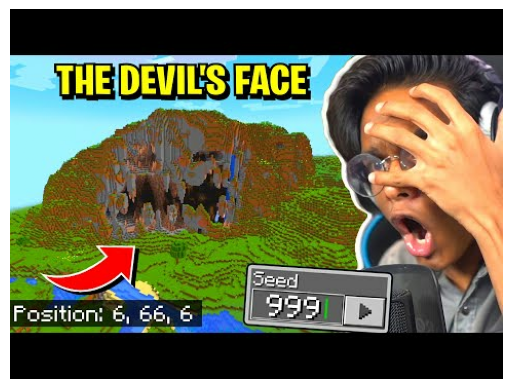

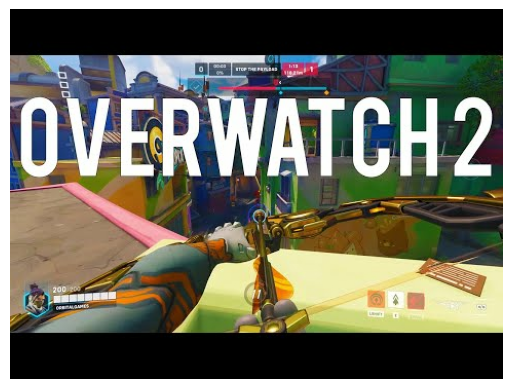

In [11]:
# Make sure the preprocessing worked

def visualize_preprocessed_image(image):
    # Scale the image from [-1, 1] to [0, 1]
    image = (image + 1) / 2

    # Clip values to [0, 1] in case of any numerical instability
    image = tf.clip_by_value(image, 0, 1)

    # Convert the image tensor to a NumPy array
    image = image.numpy()

    # Display the image
    plt.imshow(image)
    plt.axis('off')
    plt.show()

for image in dataset[:2]:
    visualize_preprocessed_image(image)


# Train the model

In [ ]:

# Example usage
BATCH_SIZE = 64

latent_dim = 100
generator = build_generator(latent_dim)
discriminator = build_discriminator()
gan = build_gan(generator, discriminator)
load_weights(gan)




Unsuccessful TensorSliceReader constructor: Failed to find any matching files for /content/drive/MyDrive/thumbnail-project/weights


In [ ]:
EPOCHS = 5000

# Batch the dataset
batched_dataset = tf.data.Dataset.from_tensor_slices(dataset).batch(BATCH_SIZE)

# Train the GAN
train(batched_dataset, EPOCHS, gan=gan, discriminator=discriminator, generator=generator)


Loaded previous weights


  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

  0%|          | 0/1188 [00:00<?, ?it/s]

# Make some stuff


In [ ]:

# Generate new thumbnails using the trained generator
noise = tf.random.normal([30, latent_dim])
generated_thumbnails = generator.predict(noise)


1/1 [==============================] - 0s 245ms/step


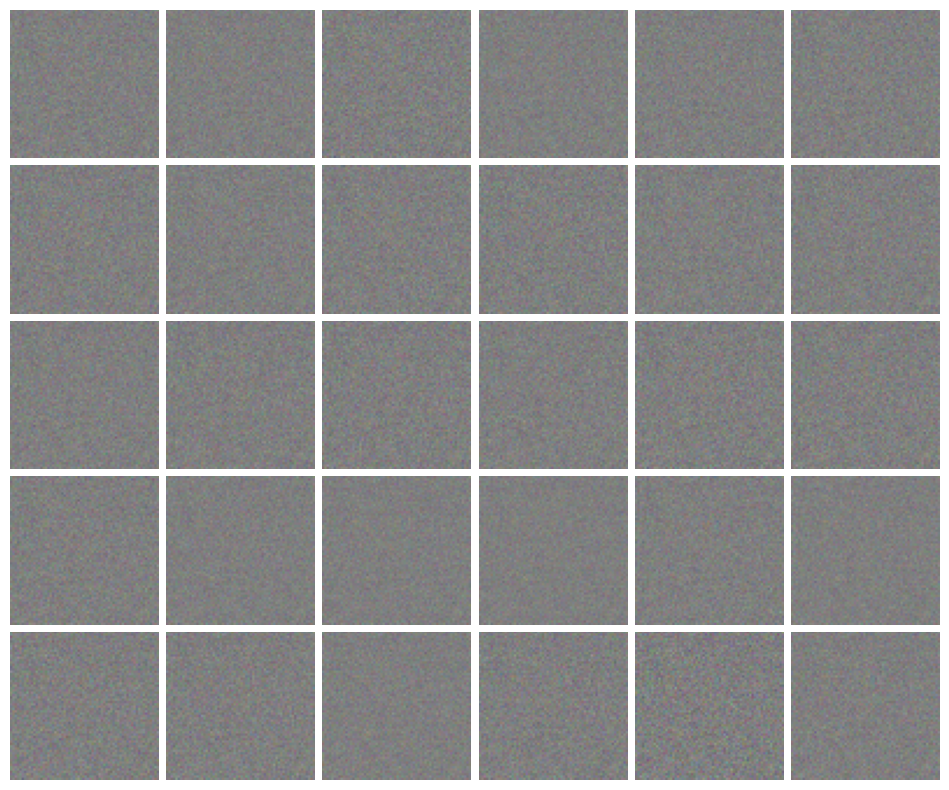

In [ ]:
visualize_thumbnails(generated_thumbnails)
# import matplotlib.pyplot as plt

# num_images = generated_thumbnails.shape[0]

# # Create a grid of subplots to display the images
# fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(12, 10))

# # Iterate over the subplots and plot the generated images
# for i, ax in enumerate(axs.flat):
#     # Rescale the pixel values from -1 to 1 to the range 0 to 255
#     image = ((generated_thumbnails[i] + 1) * 127.5).astype(int)
#     ax.imshow(image)
#     ax.axis('off')

# # Adjust the spacing between subplots
# plt.subplots_adjust(wspace=0.05, hspace=0.05)

# # Show the plot
# plt.show()